# **Klasifikasi jenis kucing melalui gambar menggunakan Machine Learning bermodel Convulational Neural Network (CNN)**

#Step 1: Melakukan Import packages
Berikut daftar library packages yang kami gunakan untuk mengklasifikasi jenis kucing. kami menggunakan tools-tools dari Tensorflow dan Keras. Setelah itu kami menjalankan method dari tensorflow untuk memastikan machine learning yang akan kami gunakan akan dilatih menggunakan GPU.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from keras import regularizers
from keras.layers import preprocessing, Input, Flatten, Dropout, Dense, Conv2D, MaxPooling2D, BatchNormalization, concatenate
from keras.models import Model, Sequential
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from tqdm import tqdm

import os
import pathlib

physical_devices= tf.config.list_physical_devices("GPU")

#Melakukan pengecekkan apakah menggunakan GPU atau tidak.
if len(physical_devices) > 0:
    print("Akan menggunakan GPU")
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
else:
    print("Tidak ada GPU terdeteksi")

Akan menggunakan GPU
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


#Step 2: Pendeklarasian variabel untuk melakukan setting opsi.
Pada Projek ini kami mendownload dataset kucing dari kaggle yang berlink: https://www.kaggle.com/datasets/3d9b637b40848b324d7ed8e7384ae9d112d0adcd8b7635dba960f0ff5e9baf6f
yang terdapat 15 jenis kucing yang sudah dilakukan data cleaning dengan tiap folder sudah terdapat 365 gambar kucing.

In [ ]:
PATH=r"Images" #Gantikan path ini ke lokasi data kaggle yang sudah didownload dan diupload ke gdrive anda
RESIZE=224
BATCH_SIZE=16
NUM_EPOCHS=32
TEST_SIZE=0.3

#Step 3: Membangun Dataframe menggunakan pandas dari folder images kucing.
Setelah itu kami akan membuat dataset dalam bentuk dataframe menggunakan library pandas.

In [ ]:
def make_dataframes(sdir):
    filepaths=[]
    labels=[]
    files_include_txt=sorted(os.listdir(sdir))
    for files in files_include_txt:
        imagepath=os.path.join(sdir, files)
        #Melakukan kondisional isdir untuk hanya folder gambar saja
        if os.path.isdir(imagepath):
            file_name=sorted(os.listdir(imagepath))
            desc=f'{files:20s}'
            for f in tqdm(file_name, ncols=130,desc=desc, unit='files', colour='green'):
            # for f in file_name:
                fpath=os.path.join(imagepath,f)
                filepaths.append(fpath)
                labels.append(files)
    d1=pd.Series(filepaths, name='filepaths')
    d2=pd.Series(labels, name='labels')
    df=pd.concat([d1, d2], axis=1)

    #Dari 5625 file akan di displit 0.7 untuk latihan, 0.3 akan digunakan untuk validasi dan testing dengan split half
    train_df, dummy_df=train_test_split(df, train_size=1.-TEST_SIZE, shuffle=True, random_state=123, stratify=df['labels'])

    valid_df, test_df=train_test_split(dummy_df, train_size=.5, shuffle=True, random_state=123, stratify=dummy_df['labels'])

    classes=sorted(train_df['labels'].unique())
    num_classes = len(classes)
    #Menampilkan Kelas kucing yang ada
    for breed in classes:
        print(f"{breed}, ", end=' ')
    print("/br")
    print('Jumlah kelas kucing yang terdapat di dataset = ', num_classes)
    print('Jumlah gambar sebagai training: ', len(train_df),
          '  Jumlah gambar sebagai testing: ', len(test_df),
          '  Jumlah gambar sebagai validasi: ', len(valid_df))
    return train_df, test_df, valid_df, classes, num_classes

train_df, test_df, valid_df, classes, NUM_CLASSES=make_dataframes(PATH)

Tuxedo              : 100%|██████████████████████████████████████████████████████████████| 375/375 [00:00<00:00, 346598.50files/s]

Abyssinian,  American Bobtail,  American Shorthair,  Bengal,  Birman,  Bombay,  British Shorthair,  Egyptian Mau,  Maine Coon,  Persian,  Ragdoll,  Russian Blue,  Siamese,  Sphynx,  Tuxedo,  /br
Jumlah kelas kucing yang terdapat di dataset =  15
Jumlah gambar sebagai training:  3937   Jumlah gambar sebagai testing:  844   Jumlah gambar sebagai validasi:  844


#Step 4: Melakukan Data generating dan Data splitting.
Variabel yang akan digunakan untuk melatih model yang akan digunakan. Tiap dataset akan dipisah dan di preprocess library preprocessing milik Keras. Untuk melakukan datasplitting kami menggunakan train_test_split dari library sklearn. Setelah itu data tersebut akan dipisahkan menjadi training, validasi, dan testing

In [ ]:
def make_generators(batch_size, train_df, test_df, valid_df, input_size):
    img_size = (input_size, input_size)
    preprocessing = keras.preprocessing.image.ImageDataGenerator(rescale=1/255.)
    train_gen=preprocessing.flow_from_dataframe(dataframe=train_df,
                                                x_col='filepaths',
                                                y_col='labels',
                                                target_size=img_size,
                                                class_mode='categorical',
                                                color_mode='rgb',
                                                shuffle=True,
                                                batch_size=batch_size)
    valid_gen=preprocessing.flow_from_dataframe(dataframe=valid_df,
                                                x_col='filepaths',
                                                y_col='labels',
                                                target_size=img_size,
                                                class_mode='categorical',
                                                color_mode='rgb',
                                                shuffle=False,
                                                batch_size=batch_size)


    length=len(test_df)
    test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]
    test_steps=int(length/test_batch_size)

    test_gen=preprocessing.flow_from_dataframe(dataframe=test_df,
                                               x_col='filepaths',
                                               y_col='labels',
                                               target_size=img_size,
                                               class_mode='categorical',
                                               color_mode='rgb',
                                               shuffle=False,
                                               batch_size=test_batch_size)

    classes=list(train_gen.class_indices.keys())
    num_classes=len(classes)
    class_indices=list(train_gen.class_indices.values())
    labels=test_gen.labels
    print ( 'Batch saat testing: ' ,test_batch_size, '  test steps/epoch: ', test_steps, ' Jumlah kelas : ', num_classes)
    return train_gen, test_gen, valid_gen, test_batch_size, test_steps, classes

train_gen, test_gen, valid_gen, test_batch_size, test_steps, classes=make_generators(BATCH_SIZE, train_df, test_df, valid_df, RESIZE)

Found 3937 validated image filenames belonging to 15 classes.
Found 844 validated image filenames belonging to 15 classes.
Found 844 validated image filenames belonging to 15 classes.
Batch saat testing:  4   test steps/epoch:  211  Jumlah kelas :  15


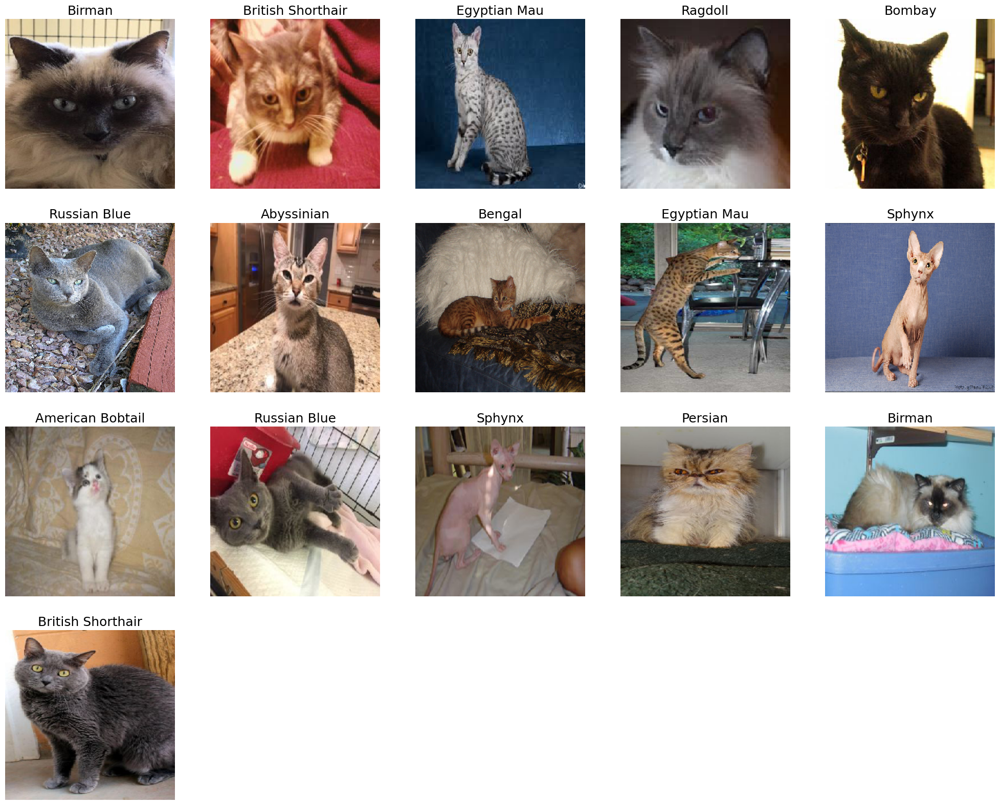

In [ ]:
def plot_images_per_batch(gen):
    class_dict=gen.class_indices
    #{'Abyssinian': 0, 'American Bobtail': 1, 'American Shorthair': 2, 'Bengal': 3,
    #Birman': 4, 'Bombay': 5, 'British Shorthair': 6, 'Egyptian Mau': 7, 'Maine Coon': 8, 'Persian': 9,
    #'Ragdoll': 10, 'Russian Blue': 11, 'Siamese': 12, 'Sphynx': 13, 'Tuxedo': 14}

    # Perbedaan antara values() dan keys()
    # t_dict=gen.class_indices.values()
    # dict_values([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14])
    class_dict_keywords=list(class_dict.keys()) #Atau kelas sama saja
    images,labels=next(gen) #next() mengambil gambar dari batch ke batch
    length=len(labels)
    if length<25:
        r=length
    else:
        r=25
    plt.figure(figsize=(25, 25))
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image=images[i]
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=class_dict_keywords[index]
        plt.title(class_name, fontsize=18)
        plt.axis('off')
    plt.show()
plot_images_per_batch(train_gen)

#Step 5: Membuat callbacks untuk memantau model saat dilatih.
Callbacks yang digunakan akan memantau keakurasian model tiap epoch dan akan memengaruhi perilaku pelatihan model selama proses pelatihan.

In [ ]:
#Callbacks untuk Model Training
early_stopping = keras.callbacks.EarlyStopping(monitor = "accuracy",
                               patience = 5,
                               mode = 'max')

reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='accuracy', factor=0.2, patience=3, min_lr=1e-6)

#Step 6: Membuat fungsi menampilkan graph plot training model

In [ ]:
def plot_training(history):
    sns.set_style('darkgrid')
    plt.figure(figsize=(8,6))
    plt.plot(history.history['accuracy'],c='blue')
    plt.plot(history.history['loss'],c='red')
    plt.plot(history.history['val_accuracy'],c='blue', linestyle='dashed')
    plt.plot(history.history['val_loss'],c='red', linestyle='dashed')
    plt.title("Accuracy and Loss Per Epochs", fontsize=20)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Accuracy and Loss", fontsize=14)
    plt.legend(["Accuracy","Loss","Val_Accuracy","Val_Loss"], fontsize=14,loc=[1.02,0.5])
    plt.show()

#Step 7: Membuat Opsi Data Augmentasi sebagai opsi tambahan untuk model berlayer input.
Data Augmentasi akan berfungsi meninkatkan keakurasian model dan mengurangi terjadinya overfitting

In [ ]:
# Data Augmentation Step
augment = tf.keras.Sequential([
  keras.layers.Resizing(224,224),
  keras.layers.RandomCrop(224,224, seed=62),
  keras.layers.RandomFlip("horizontal"),
  keras.layers.RandomRotation(0.3),
  keras.layers.RandomZoom(0.3),
  keras.layers.RandomContrast(0.2),
])

#Step 8: Membuat Model CNN dengan keras

In [ ]:
model_basic = Sequential()

model_basic.add(Conv2D(32, (3, 3), activation='relu', padding='same',
                              input_shape=(RESIZE, RESIZE, 3)))
model_basic.add(MaxPooling2D((2,2)))
model_basic.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model_basic.add(MaxPooling2D((2,2)))
model_basic.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model_basic.add(MaxPooling2D((2,2)))
model_basic.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model_basic.add(MaxPooling2D((2,2)))
model_basic.add(Flatten())
model_basic.add(Dropout(0.5))
model_basic.add(Dense((NUM_CLASSES), activation='softmax'))

model_basic.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 128)     

#Step 9: Melatih model yang sudah dibuat dengan dataset training

Epoch 1/32
247/247 [==============================] - 1198s 5s/step - loss: 2.6048 - accuracy: 0.1237 - val_loss: 2.5030 - val_accuracy: 0.1730 - lr: 0.0010
Epoch 2/32
247/247 [==============================] - 30s 121ms/step - loss: 2.3383 - accuracy: 0.2235 - val_loss: 2.3455 - val_accuracy: 0.2239 - lr: 0.0010
Epoch 3/32
247/247 [==============================] - 30s 121ms/step - loss: 2.1157 - accuracy: 0.2962 - val_loss: 2.1945 - val_accuracy: 0.2796 - lr: 0.0010
Epoch 4/32
247/247 [==============================] - 30s 120ms/step - loss: 1.8674 - accuracy: 0.3952 - val_loss: 2.1691 - val_accuracy: 0.2855 - lr: 0.0010
Epoch 5/32
247/247 [==============================] - 30s 123ms/step - loss: 1.6676 - accuracy: 0.4577 - val_loss: 2.2818 - val_accuracy: 0.2855 - lr: 0.0010
Epoch 6/32
247/247 [==============================] - 29s 118ms/step - loss: 1.4243 - accuracy: 0.5367 - val_loss: 2.3564 - val_accuracy: 0.2962 - lr: 0.0010
Epoch 7/32
247/247 [==============================] -

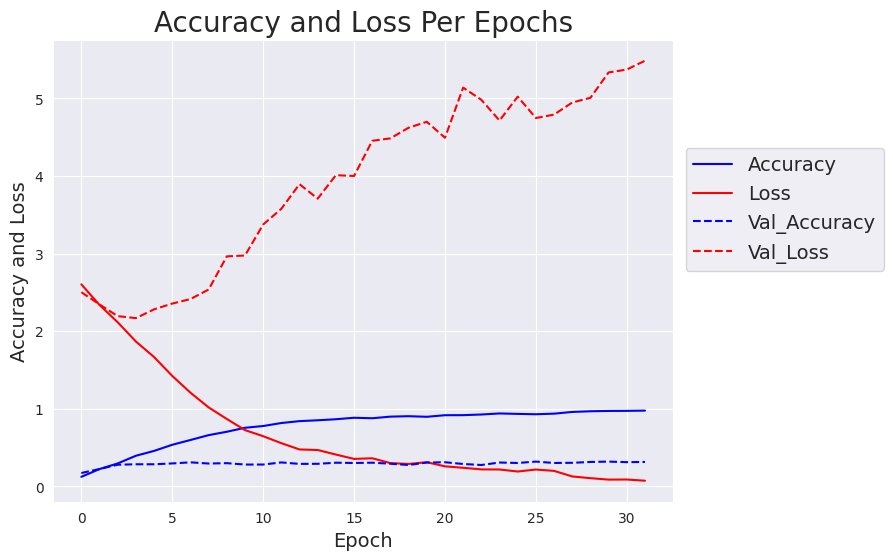

In [ ]:
model_basic.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


history = model_basic.fit(train_gen,
                         epochs=NUM_EPOCHS,
                         verbose=1,
                         validation_data=valid_gen,
                         validation_steps=None,
                         callbacks=[early_stopping,
                                    reduce_lr]
)
plot_training(history)

#Step 10: Membuat fungsi untuk menggunakan model yang sudah dilatih untuk memprediksi gambar kucing Dan mengevaluasi model dengan Confussion Matrix

211/211 [==============================] - 203s 963ms/step
there were 549 errors in 844 tests for an accuracy of  34.95



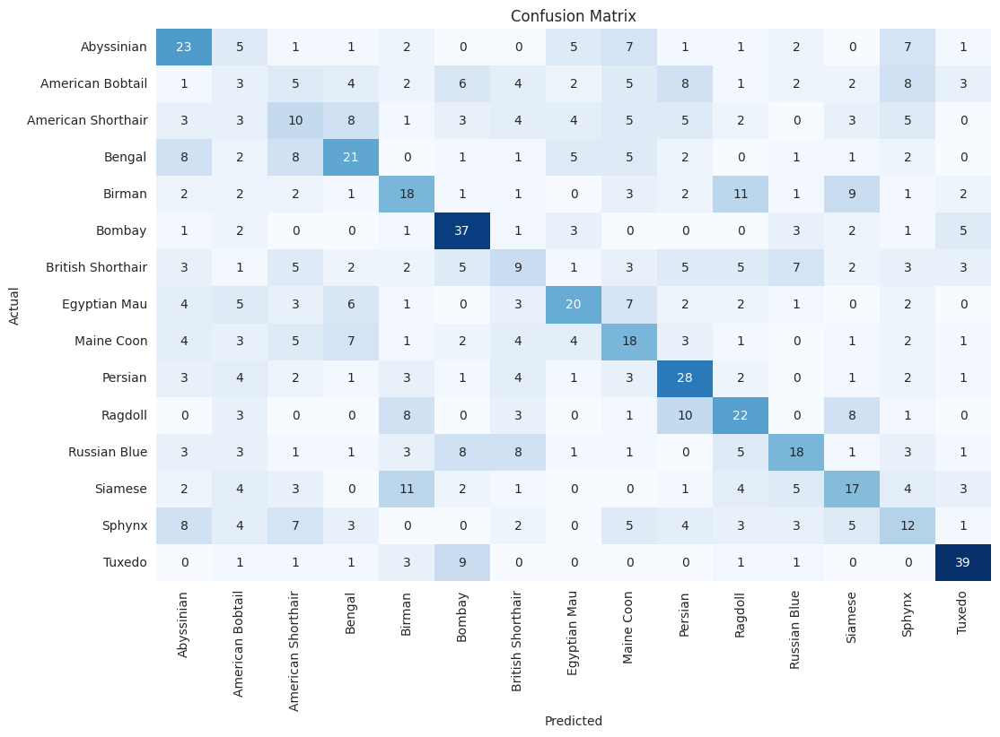

Classification Report:
----------------------
                     precision    recall  f1-score   support

        Abyssinian     0.3538    0.4107    0.3802        56
  American Bobtail     0.0667    0.0536    0.0594        56
American Shorthair     0.1887    0.1786    0.1835        56
            Bengal     0.3750    0.3684    0.3717        57
            Birman     0.3214    0.3214    0.3214        56
            Bombay     0.4933    0.6607    0.5649        56
 British Shorthair     0.2000    0.1607    0.1782        56
      Egyptian Mau     0.4348    0.3571    0.3922        56
        Maine Coon     0.2857    0.3214    0.3025        56
           Persian     0.3944    0.5000    0.4409        56
           Ragdoll     0.3667    0.3929    0.3793        56
      Russian Blue     0.4091    0.3158    0.3564        57
           Siamese     0.3269    0.2982    0.3119        57
            Sphynx     0.2264    0.2105    0.2182        57
            Tuxedo     0.6500    0.6964    0.6724   

In [ ]:
#Fungsi Prediksi dengan menggunakan model yang sudah dilatih
def predict_cat_breed(image, model):
    img = keras.preprocessing.image.load_img(image)
    img_arr = keras.utils.img_to_array(img)
    img_arr = img_arr/255.
    img_arr = tf.image.resize(img_arr,[224,224])
    preds_arr = model.predict(tf.expand_dims(img_arr, axis=0))
    pred = np.argmax(preds_arr)
    pred_prob = np.max(preds_arr)
    if pred_prob > 0.8:
        prediction = classes[pred]
    elif pred_prob < 0.8 and pred_prob >= 0.5 :
        prediction = "Kemungkinan "+ str(classes[pred])
    else:
        prediction = "Gambar yang Diinput bukan Kucing"

    plt.figure(figsize=(2,2), dpi=200)
    plt.imshow(img)
    plt.title(prediction, fontsize=12)
    plt.axis('off')
    plt.figtext(0.5, 0.01, pred_prob, wrap=True, horizontalalignment='center', fontsize=12)

#Fungsi Confussion Matrix
def print_in_color(txt_msg,fore_tupple=(0,255,255),back_tupple=(100,100,100)):
    #fungsi ini akan menampilkan teks yang berwarna cyan, untuk menghighlight teks yang penting seperti metriks akurasi.
    rf,gf,bf=fore_tupple
    rb,gb,bb=back_tupple
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m'
    print(msg .format(mat), flush=True)
    print('\33[0m', flush=True) # returns default print color to back to black
    return

def CM_report(gen, model):
    y_pred= []
    error_list=[]
    y_true=gen.labels
    classes=list(gen.class_indices.keys())
    class_count=len(classes)
    errors=0
    preds=model.predict(gen, verbose=1)
    tests=len(preds)
    for i, p in enumerate(preds):
        file=gen.filenames[i]
        pred_index=np.argmax(p)
        true_index=gen.labels[i]  # Ingat labels itu berupa integer
        if pred_index != true_index: # Kondisi dimana misklasifikasi terjadi.
            errors=errors + 1
            file=gen.filenames[i]
            error_class=classes[pred_index]
            t=(file, error_class)
            error_list.append(t)
        y_pred.append(pred_index)

    acc=( 1-errors/tests) * 100
    msg=f'there were {errors} errors in {tests} tests for an accuracy of {acc:6.2f}'
    print_in_color(msg, (0,255,255), (100,100,100)) # fungsi menghighlight teks
    ypred=np.array(y_pred)
    ytrue=np.array(y_true)
    f1score=f1_score(ytrue, ypred, average='weighted')* 100
    if class_count <=30:
        cm = confusion_matrix(ytrue, ypred )
        # plotting confusion matrix
        plt.figure(figsize=(12, 8))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
        plt.xticks(np.arange(class_count)+.5, classes, rotation=90)
        plt.yticks(np.arange(class_count)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes, digits= 4) # Membuat laporan klasifikasi tiap kelas
    print("Classification Report:\n----------------------\n", clr)
    return errors, tests, error_list, f1score

errors, tests, error_list, f1score =CM_report(test_gen, model_basic)
print(f1score)

#Melatih model CNN dengan arsitektur ResNet101V2

In [ ]:
# ResNet101V2

model_ResNet = keras.applications.ResNet101V2(include_top=False,
                                            weights='imagenet',
                                            pooling='max')
model_ResNet.trainable = False

i = Input(shape=(RESIZE,RESIZE,3))
x = model_ResNet(i, training=False)
x = Flatten()(x)
x = Dropout(0.25)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.4)(x)
x = Dense(NUM_CLASSES, activation='softmax')(x)

model_ResNet = Model(i,x)

model_ResNet.summary()

171317808/171317808 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet101v2 (Functional)    (None, 2048)              42626560  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 256)               524544    
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                            

#Step 11: Melatih model CNN ResNet101V2

Epoch 1/32
247/247 [==============================] - 44s 144ms/step - loss: 3.6793 - accuracy: 0.3091 - val_loss: 1.5615 - val_accuracy: 0.5486 - lr: 0.0010
Epoch 2/32
247/247 [==============================] - 33s 133ms/step - loss: 1.7069 - accuracy: 0.4597 - val_loss: 1.2727 - val_accuracy: 0.5948 - lr: 0.0010
Epoch 3/32
247/247 [==============================] - 38s 153ms/step - loss: 1.5130 - accuracy: 0.4910 - val_loss: 1.1576 - val_accuracy: 0.5936 - lr: 0.0010
Epoch 4/32
247/247 [==============================] - 33s 132ms/step - loss: 1.3607 - accuracy: 0.5431 - val_loss: 1.0967 - val_accuracy: 0.6410 - lr: 0.0010
Epoch 5/32
247/247 [==============================] - 33s 133ms/step - loss: 1.2895 - accuracy: 0.5547 - val_loss: 1.0074 - val_accuracy: 0.6481 - lr: 0.0010
Epoch 6/32
247/247 [==============================] - 33s 132ms/step - loss: 1.2281 - accuracy: 0.5687 - val_loss: 1.0459 - val_accuracy: 0.6374 - lr: 0.0010
Epoch 7/32
247/247 [==============================] 

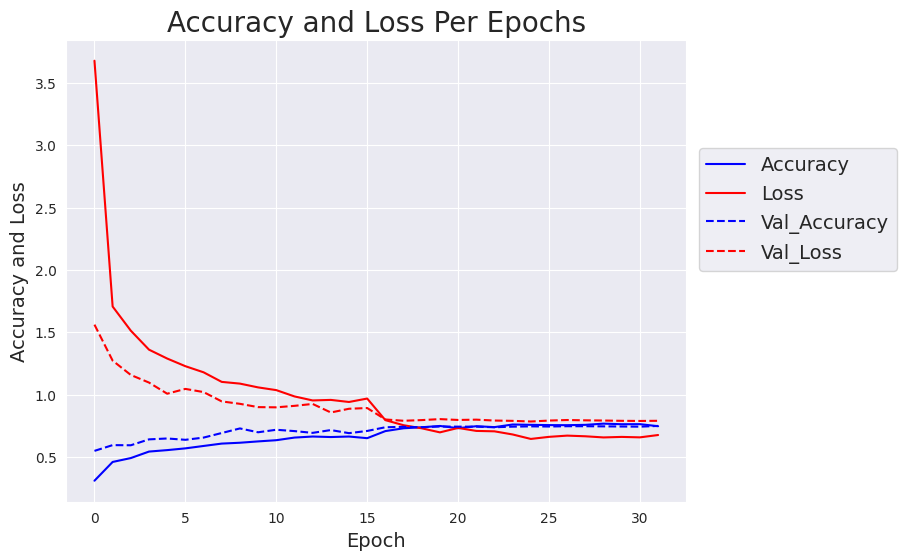

211/211 [==============================] - 10s 37ms/step
there were 227 errors in 844 tests for an accuracy of  73.10



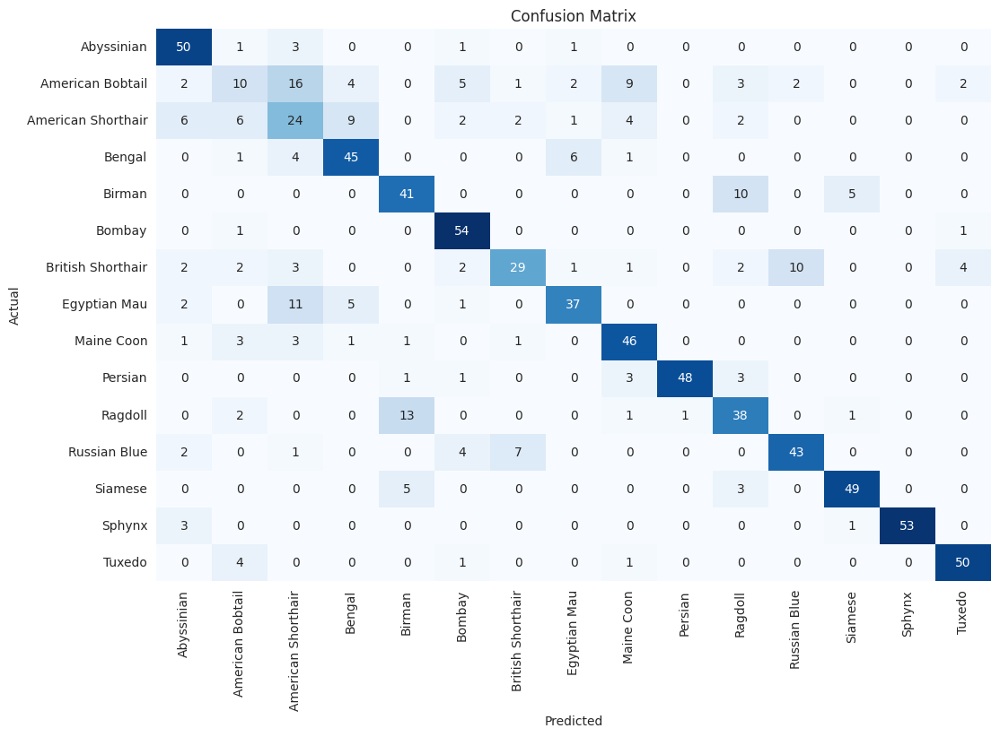

Classification Report:
----------------------
                     precision    recall  f1-score   support

        Abyssinian     0.7353    0.8929    0.8065        56
  American Bobtail     0.3333    0.1786    0.2326        56
American Shorthair     0.3692    0.4286    0.3967        56
            Bengal     0.7031    0.7895    0.7438        57
            Birman     0.6721    0.7321    0.7009        56
            Bombay     0.7606    0.9643    0.8504        56
 British Shorthair     0.7250    0.5179    0.6042        56
      Egyptian Mau     0.7708    0.6607    0.7115        56
        Maine Coon     0.6970    0.8214    0.7541        56
           Persian     0.9796    0.8571    0.9143        56
           Ragdoll     0.6230    0.6786    0.6496        56
      Russian Blue     0.7818    0.7544    0.7679        57
           Siamese     0.8750    0.8596    0.8673        57
            Sphynx     1.0000    0.9298    0.9636        57
            Tuxedo     0.8772    0.8929    0.8850   

In [ ]:
model_ResNet.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model_ResNet.fit(train_gen,
                         epochs=NUM_EPOCHS,
                         verbose=1,
                         validation_data=valid_gen,
                         validation_steps=None,
                         callbacks=[early_stopping,
                                    reduce_lr]
)
plot_training(history)
errors, tests, error_list, f1score =CM_report(test_gen, model_ResNet)
print(f1score)

# Melatih ResNet101v2 dengan Data Augmentation

In [ ]:
# ResNet101V2 + Data Augmentation

model_ResNetV2 = keras.applications.ResNet101V2(include_top=False,
                                            weights='imagenet',
                                            pooling='avg')
model_ResNetV2.trainable = False

i = augment(Input(shape=(RESIZE,RESIZE,3)))
x = model_ResNetV2(i, training=False)
x = Flatten()(x)
x = Dropout(0.25)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.4)(x)
x = Dense(NUM_CLASSES, activation='softmax')(x)

model_ResNetV2 = Model(i,x)

model_ResNetV2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet101v2 (Functional)    (None, 2048)              42626560  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dropout_3 (Dropout)         (None, 2048)              0         
                                                                 
 dense_3 (Dense)             (None, 256)               524544    
                                                                 
 dropout_4 (Dropout)         (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 15)                3855

#Step 13: Melatih model CNN ResNet101V2+Augmentation dengan dataset yang sama

Epoch 1/32
247/247 [==============================] - 43s 138ms/step - loss: 1.4275 - accuracy: 0.5517 - val_loss: 0.8249 - val_accuracy: 0.7382 - lr: 0.0010
Epoch 2/32
247/247 [==============================] - 38s 152ms/step - loss: 0.9020 - accuracy: 0.7000 - val_loss: 0.7414 - val_accuracy: 0.7583 - lr: 0.0010
Epoch 3/32
247/247 [==============================] - 37s 150ms/step - loss: 0.7839 - accuracy: 0.7330 - val_loss: 0.7648 - val_accuracy: 0.7453 - lr: 0.0010
Epoch 4/32
247/247 [==============================] - 32s 131ms/step - loss: 0.7122 - accuracy: 0.7475 - val_loss: 0.7509 - val_accuracy: 0.7512 - lr: 0.0010
Epoch 5/32
247/247 [==============================] - 37s 151ms/step - loss: 0.6703 - accuracy: 0.7747 - val_loss: 0.8239 - val_accuracy: 0.7405 - lr: 0.0010
Epoch 6/32
247/247 [==============================] - 32s 129ms/step - loss: 0.6151 - accuracy: 0.7851 - val_loss: 0.7389 - val_accuracy: 0.7571 - lr: 0.0010
Epoch 7/32
247/247 [==============================] 

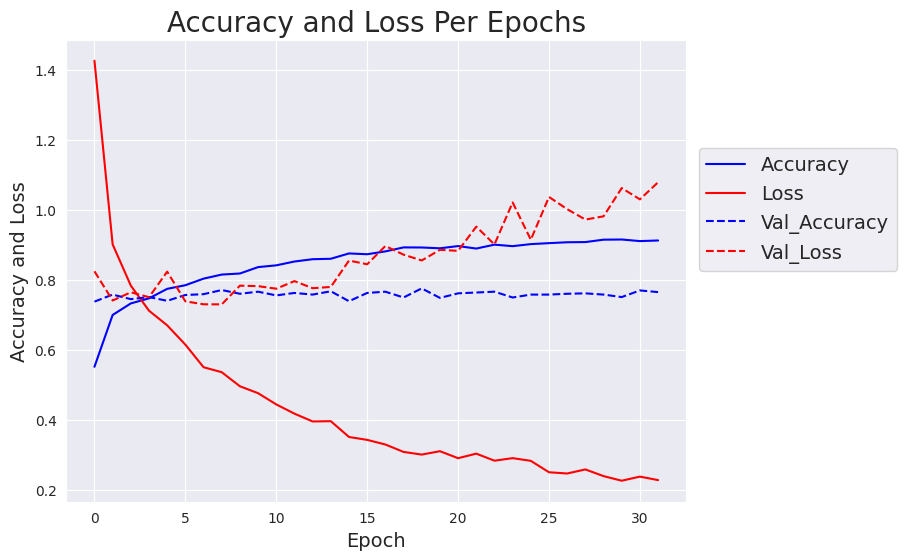

211/211 [==============================] - 9s 37ms/step
there were 201 errors in 844 tests for an accuracy of  76.18



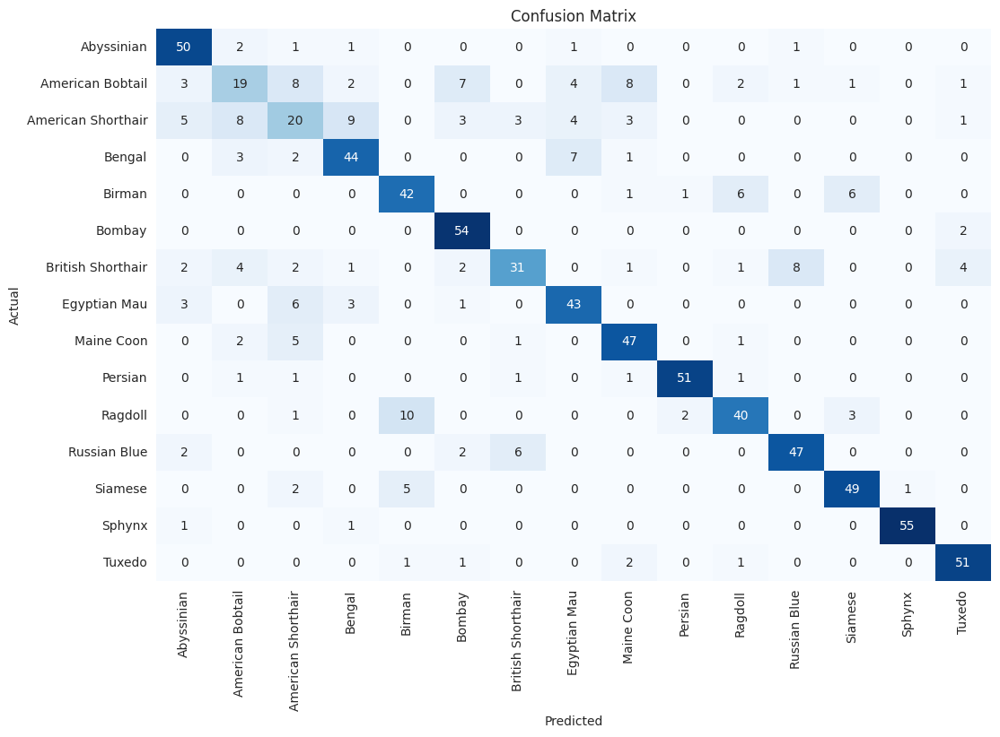

Classification Report:
----------------------
                     precision    recall  f1-score   support

        Abyssinian     0.7576    0.8929    0.8197        56
  American Bobtail     0.4872    0.3393    0.4000        56
American Shorthair     0.4167    0.3571    0.3846        56
            Bengal     0.7213    0.7719    0.7458        57
            Birman     0.7241    0.7500    0.7368        56
            Bombay     0.7714    0.9643    0.8571        56
 British Shorthair     0.7381    0.5536    0.6327        56
      Egyptian Mau     0.7288    0.7679    0.7478        56
        Maine Coon     0.7344    0.8393    0.7833        56
           Persian     0.9444    0.9107    0.9273        56
           Ragdoll     0.7692    0.7143    0.7407        56
      Russian Blue     0.8246    0.8246    0.8246        57
           Siamese     0.8305    0.8596    0.8448        57
            Sphynx     0.9821    0.9649    0.9735        57
            Tuxedo     0.8644    0.9107    0.8870   

In [ ]:
model_ResNetV2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model_ResNetV2.fit(train_gen,
                         epochs=NUM_EPOCHS,
                         verbose=1,
                         validation_data=valid_gen,
                         validation_steps=None,
                         callbacks=[early_stopping,
                                    reduce_lr]
)
plot_training(history)
errors, tests, error_list, f1score =CM_report(test_gen, model_ResNetV2)
print(f1score)

#Melatih Model baru dengan DenseNet169

In [ ]:
# DenseNet169

model_DenseNet = keras.applications.DenseNet169(include_top=False,
                                            weights='imagenet',
                                            pooling='avg')
model_DenseNet.trainable = False

i = Input(shape=(RESIZE,RESIZE,3))
x = model_DenseNet(i, training=False)
x = Flatten()(x)
x = Dropout(0.25)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.4)(x)
x = Dense(NUM_CLASSES, activation='softmax')(x)

model_DenseNet = Model(i,x)

model_DenseNet.summary()

51877672/51877672 [==============================] - 0s 0us/step
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 densenet169 (Functional)    (None, 1664)              12642880  
                                                                 
 flatten_3 (Flatten)         (None, 1664)              0         
                                                                 
 dropout_5 (Dropout)         (None, 1664)              0         
                                                                 
 dense_5 (Dense)             (None, 256)               426240    
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                            

#Step 14: Melatih model CNN DenseNet dengan dataset yang sama

Epoch 1/32
247/247 [==============================] - 49s 152ms/step - loss: 1.7094 - accuracy: 0.4455 - val_loss: 0.9465 - val_accuracy: 0.6955 - lr: 0.0010
Epoch 2/32
247/247 [==============================] - 32s 127ms/step - loss: 1.0830 - accuracy: 0.6243 - val_loss: 0.8345 - val_accuracy: 0.7133 - lr: 0.0010
Epoch 3/32
247/247 [==============================] - 31s 127ms/step - loss: 0.9447 - accuracy: 0.6754 - val_loss: 0.7831 - val_accuracy: 0.7417 - lr: 0.0010
Epoch 4/32
247/247 [==============================] - 37s 149ms/step - loss: 0.8838 - accuracy: 0.6891 - val_loss: 0.7753 - val_accuracy: 0.7263 - lr: 0.0010
Epoch 5/32
247/247 [==============================] - 31s 127ms/step - loss: 0.8119 - accuracy: 0.7071 - val_loss: 0.7496 - val_accuracy: 0.7334 - lr: 0.0010
Epoch 6/32
247/247 [==============================] - 37s 149ms/step - loss: 0.7787 - accuracy: 0.7348 - val_loss: 0.7191 - val_accuracy: 0.7417 - lr: 0.0010
Epoch 7/32
247/247 [==============================] 

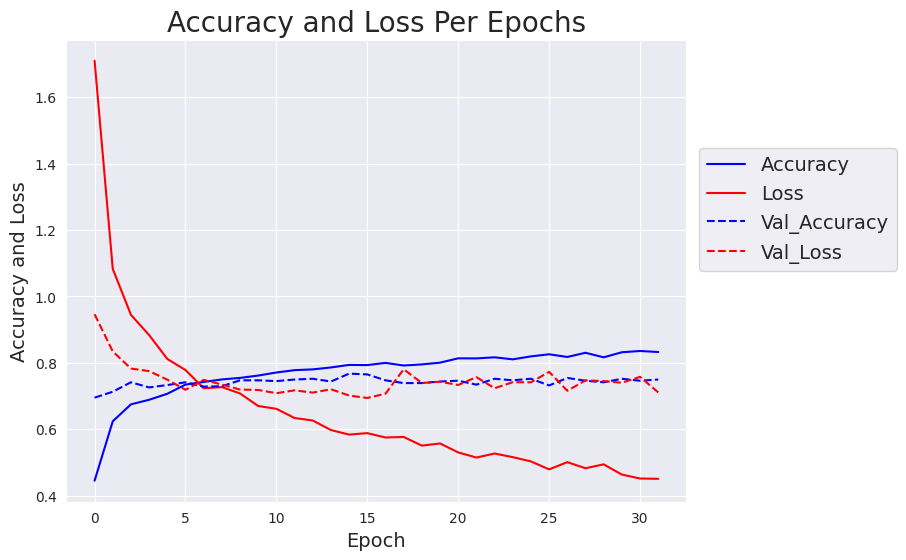

211/211 [==============================] - 12s 38ms/step
there were 201 errors in 844 tests for an accuracy of  76.18



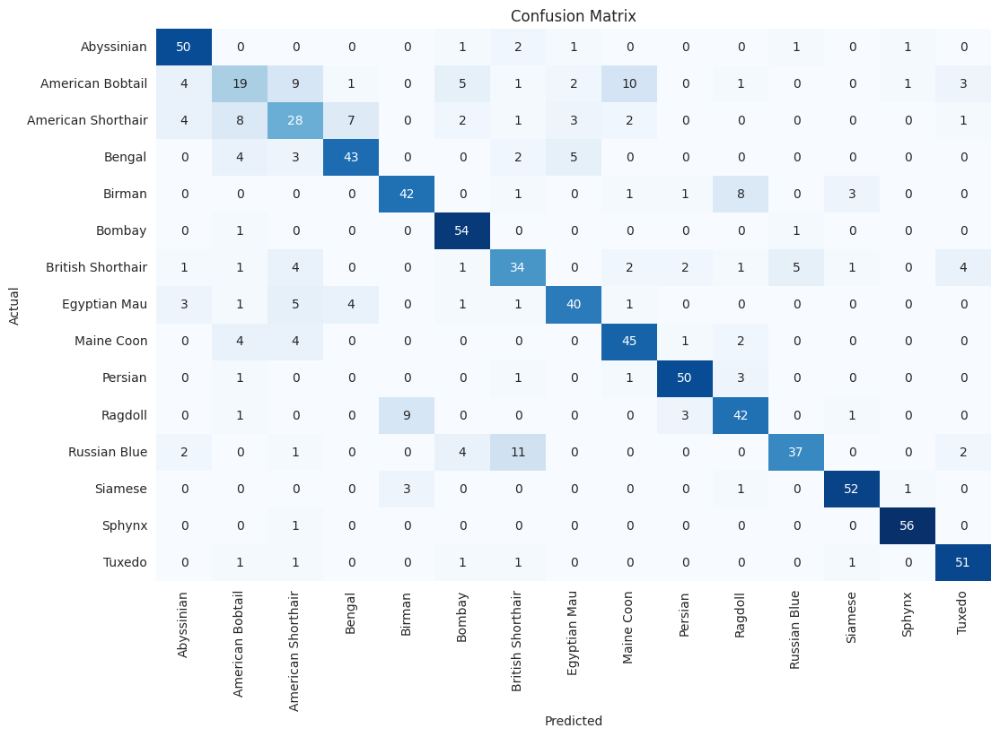

Classification Report:
----------------------
                     precision    recall  f1-score   support

        Abyssinian     0.7812    0.8929    0.8333        56
  American Bobtail     0.4634    0.3393    0.3918        56
American Shorthair     0.5000    0.5000    0.5000        56
            Bengal     0.7818    0.7544    0.7679        57
            Birman     0.7778    0.7500    0.7636        56
            Bombay     0.7826    0.9643    0.8640        56
 British Shorthair     0.6182    0.6071    0.6126        56
      Egyptian Mau     0.7843    0.7143    0.7477        56
        Maine Coon     0.7258    0.8036    0.7627        56
           Persian     0.8772    0.8929    0.8850        56
           Ragdoll     0.7241    0.7500    0.7368        56
      Russian Blue     0.8409    0.6491    0.7327        57
           Siamese     0.8966    0.9123    0.9043        57
            Sphynx     0.9492    0.9825    0.9655        57
            Tuxedo     0.8361    0.9107    0.8718   

In [ ]:
model_DenseNet.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model_DenseNet.fit(train_gen,
                         epochs=NUM_EPOCHS,
                         verbose=1,
                         validation_data=valid_gen,
                         validation_steps=None,
                         callbacks=[early_stopping,
                                    reduce_lr]
)
plot_training(history)
errors, tests, error_list, f1score =CM_report(test_gen, model_DenseNet)
print(f1score)

# Melatih Gabungan model DenseNet169 dan ResNet101V2

In [ ]:
model_RN = keras.applications.ResNet101V2(include_top=False,
                                            weights='imagenet',
                                            pooling='max')

model_DN = keras.applications.DenseNet169(include_top=False,
                                            weights='imagenet',
                                            pooling='max')

model_RN.trainable = False
model_DN.trainable = False

i = augment(Input(shape=(RESIZE,RESIZE,3)))
o_RN = model_RN(i)
o_DN = model_DN(i)

# Menambah BatchNormalization layers
o_RN = BatchNormalization()(o_RN)
o_DN = BatchNormalization()(o_DN)

output = concatenate([o_RN, o_DN], axis=1)

x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(output)
x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
                bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
x = Dropout(0.25)(x)
x = Dense((NUM_CLASSES), activation='softmax')(x)

model_mixed = Model(i,x)

model_mixed.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 resnet101v2 (Functional)       (None, 2048)         42626560    ['input_14[0][0]']               
                                                                                                  
 densenet169 (Functional)       (None, 1664)         12642880    ['input_14[0][0]']               
                                                                                                  
 batch_normalization_3 (BatchNo  (None, 2048)        8192        ['resnet101v2[1][0]']      

#Step 15: Latihan Densenet169+ResNet101 + Data Augmentation

Epoch 1/140
247/247 [==============================] - 68s 205ms/step - loss: 6.8440 - accuracy: 0.6363 - val_loss: 4.0769 - val_accuracy: 0.7358 - lr: 0.0010
Epoch 2/140
247/247 [==============================] - 51s 204ms/step - loss: 2.7579 - accuracy: 0.8230 - val_loss: 2.3996 - val_accuracy: 0.7334 - lr: 0.0010
Epoch 3/140
247/247 [==============================] - 45s 184ms/step - loss: 2.1028 - accuracy: 0.8072 - val_loss: 2.3888 - val_accuracy: 0.7713 - lr: 0.0010
Epoch 4/140
247/247 [==============================] - 46s 185ms/step - loss: 2.0434 - accuracy: 0.8037 - val_loss: 2.3917 - val_accuracy: 0.7322 - lr: 0.0010
Epoch 5/140
247/247 [==============================] - 47s 190ms/step - loss: 2.0292 - accuracy: 0.8070 - val_loss: 2.2929 - val_accuracy: 0.7239 - lr: 0.0010
Epoch 6/140
247/247 [==============================] - 48s 196ms/step - loss: 1.6447 - accuracy: 0.8915 - val_loss: 1.7051 - val_accuracy: 0.7998 - lr: 2.0000e-04
Epoch 7/140
247/247 [=====================

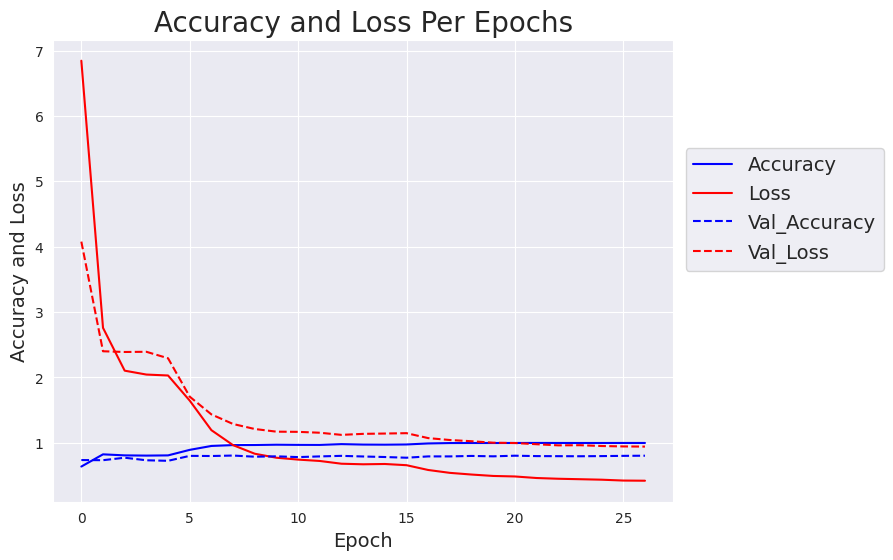

211/211 [==============================] - 17s 54ms/step
there were 180 errors in 844 tests for an accuracy of  78.67



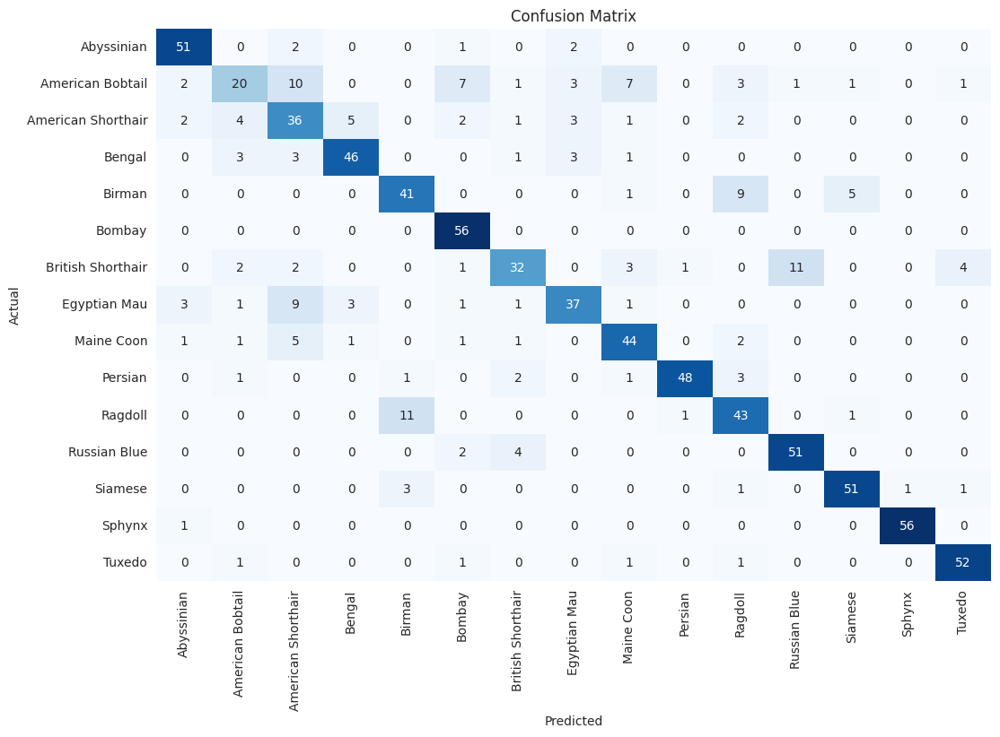

Classification Report:
----------------------
                     precision    recall  f1-score   support

        Abyssinian     0.8500    0.9107    0.8793        56
  American Bobtail     0.6061    0.3571    0.4494        56
American Shorthair     0.5373    0.6429    0.5854        56
            Bengal     0.8364    0.8070    0.8214        57
            Birman     0.7321    0.7321    0.7321        56
            Bombay     0.7778    1.0000    0.8750        56
 British Shorthair     0.7442    0.5714    0.6465        56
      Egyptian Mau     0.7708    0.6607    0.7115        56
        Maine Coon     0.7333    0.7857    0.7586        56
           Persian     0.9600    0.8571    0.9057        56
           Ragdoll     0.6719    0.7679    0.7167        56
      Russian Blue     0.8095    0.8947    0.8500        57
           Siamese     0.8793    0.8947    0.8870        57
            Sphynx     0.9825    0.9825    0.9825        57
            Tuxedo     0.8966    0.9286    0.9123   

In [ ]:
model_mixed.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model_mixed.fit(train_gen,
                         epochs=140,
                         verbose=1,
                         validation_data=valid_gen,
                         validation_steps=None,
                         callbacks=[early_stopping,
                                    reduce_lr]
)

plot_training(history)
errors, tests, error_list, f1score =CM_report(test_gen, model_mixed)
print(f1score)

#Selesai

Model Basic
1/1 [==============================] - 0s 22ms/step
Model Resnet101V2
1/1 [==============================] - 0s 28ms/step
Model Resnet101V2 + Data Augmentation
1/1 [==============================] - 0s 27ms/step
Model DenseNet169
1/1 [==============================] - 0s 34ms/step
Model gabungan
1/1 [==============================] - 0s 43ms/step


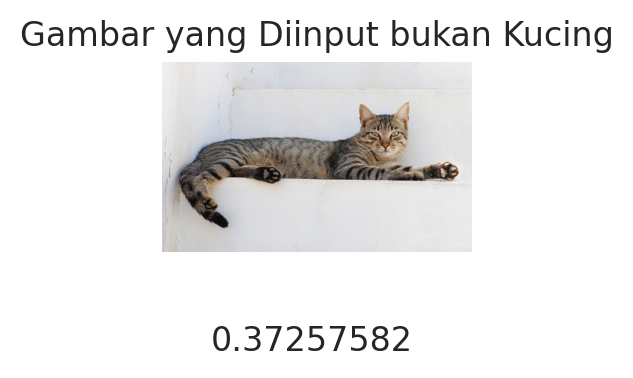

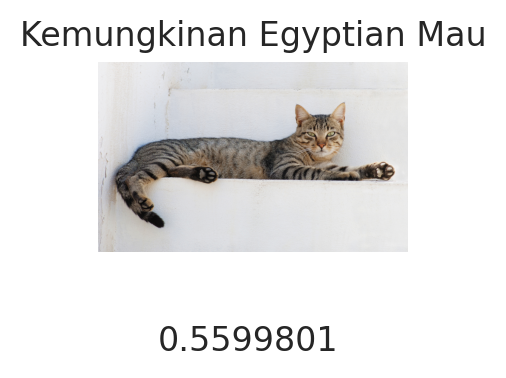

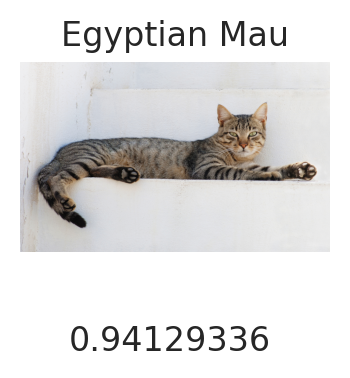

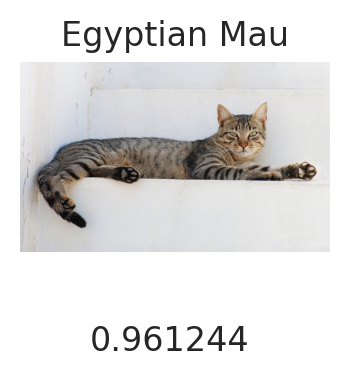

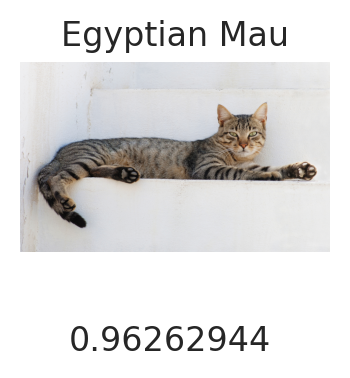

In [ ]:
image_url="https://upload.wikimedia.org/wikipedia/commons/1/15/Cat_August_2010-4.jpg"
image = keras.utils.get_file(origin=image_url)
print("Model Basic")
predict_cat_breed(image, model_basic)

print("Model Resnet101V2")
predict_cat_breed(image, model_ResNet)

print("Model Resnet101V2 + Data Augmentation")
predict_cat_breed(image, model_ResNetV2)

print("Model DenseNet169")
predict_cat_breed(image, model_DenseNet)

print("Model gabungan")
predict_cat_breed(image, model_mixed)

   8192/Unknown - 0s 0us/stepModel Basic
1/1 [==============================] - 0s 58ms/step
Model Resnet101V2
1/1 [==============================] - 0s 100ms/step
Model Resnet101V2 + Data Augmentation
1/1 [==============================] - 0s 106ms/step
Model DenseNet169
1/1 [==============================] - 0s 91ms/step
Model gabungan
1/1 [==============================] - 0s 134ms/step


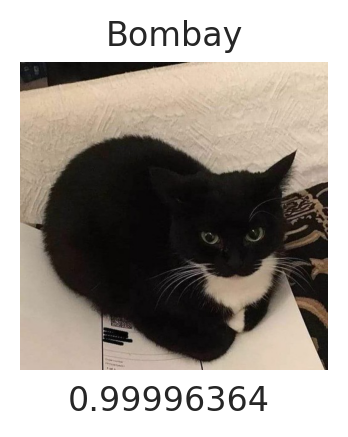

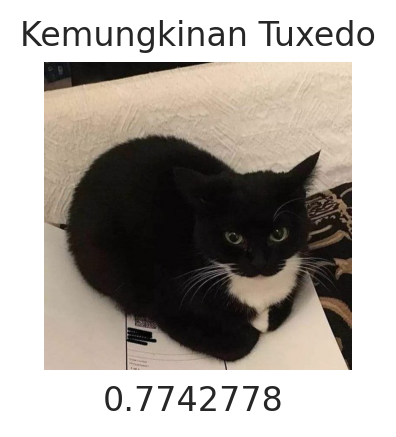

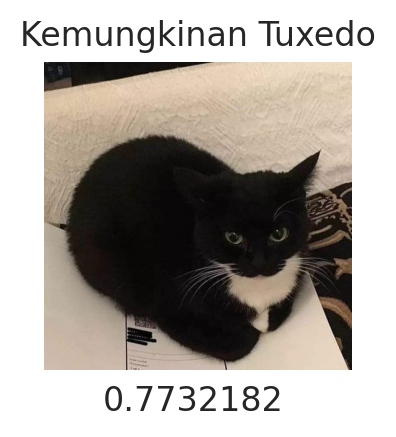

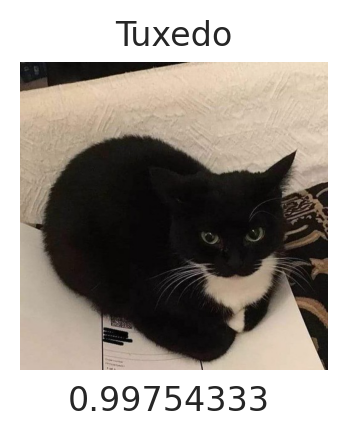

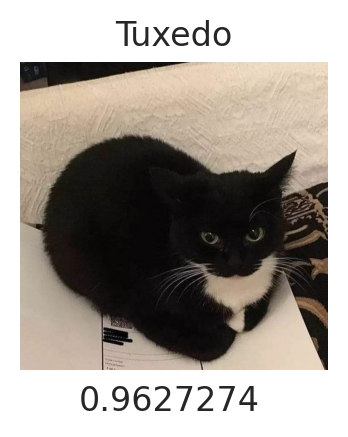

In [ ]:
image_url="https://i1.sndcdn.com/avatars-d2S4V3ZNc04RX8kb-dlrQrg-t500x500.jpg"
image = keras.utils.get_file(origin=image_url)
print("Model Basic")
predict_cat_breed(image, model_basic)

print("Model Resnet101V2")
predict_cat_breed(image, model_ResNet)

print("Model Resnet101V2 + Data Augmentation")
predict_cat_breed(image, model_ResNetV2)

print("Model DenseNet169")
predict_cat_breed(image, model_DenseNet)

print("Model gabungan")
predict_cat_breed(image, model_mixed)

Model Basic
1/1 [==============================] - 0s 32ms/step
Model Resnet101V2
1/1 [==============================] - 0s 44ms/step
Model Resnet101V2 + Data Augmentation
1/1 [==============================] - 0s 43ms/step
Model DenseNet169
1/1 [==============================] - 0s 48ms/step
Model gabungan
1/1 [==============================] - 0s 63ms/step


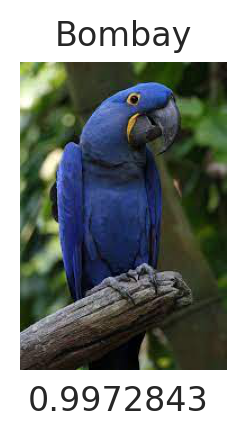

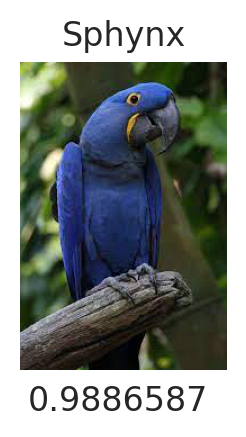

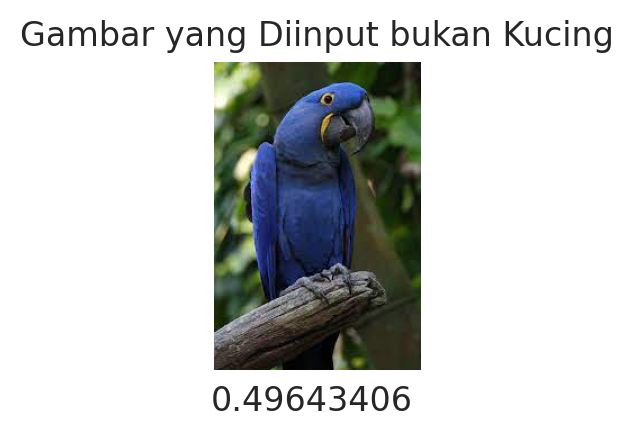

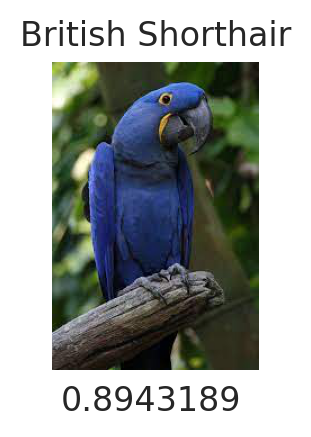

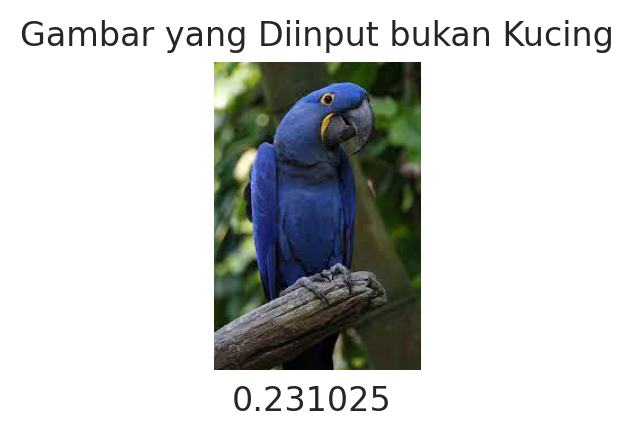

In [ ]:
image_url="data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoHCBYVFRgWFhUZGBgZGhwYGhoYGBgYGhgaGhoZGRkYGhgcIS4lHB4rIRgYJjgmKy8xNTU1GiQ7QDs0Py40NTEBDAwMEA8QHxISHjQrJSs0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQxNDE0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NP/AABEIARIAuAMBIgACEQEDEQH/xAAcAAACAgMBAQAAAAAAAAAAAAAEBQIDAAEGBwj/xAA+EAABAwIEAwUFBgUDBQEAAAABAAIRAyEEEjFBBVFhInGBkaEGEzKx8EJSYsHR4RQjcoLxkqLCFSQzNFMH/8QAGgEAAwEBAQEAAAAAAAAAAAAAAQIDAAQFBv/EACkRAAICAgIBAgcAAwEAAAAAAAABAhEDIRIxBEFREyIyQmFxsTOBoSP/2gAMAwEAAhEDEQA/AHrKbWCNEr4xjY7KdVMMXlLsTwV1R7bQAfNePjxyg7l2Te1QJwLhrnPDyJ5SurxDHlkCwjZGYDCBjAFXjcU0CJTxTjbbCtaOG4jwyZtsuLxNOHEL0riWJBnkuA4mAXkhN4+Tk2h1oU5VqbqxwWgF2BswhQIU3KCIrZAhbC05SCLMM+EVO1GybcTxwY2AVzVN5aZC1iaxebrnyRuViNbKXukkndQUsqupsWboDIBsBQlW1AqnWCWIEV1+IuAygoBxlbeblacupaHWjTTcJ1Sd2EkbqmbQcqLGigSsb9Fi3UMarERj6SoYW2iubh42TGjRshse/KFyqPqydA1cwDdcTxzEZXTNpRHH/aVtMZd+i4fG8UdVPIKeWMZKjWg/iXErQPFJHuzBUYmvA1VWDxAcSFTFiUI6CiFRaVlXVUkqyCSddRAAWpWgCbASdgN0yMaeoynWA4CXdqs4sb90fGfyaO+/ROqZw9DtMY1sCc5lz+sOdceC7MXhzkrlpfki8qWlsQ4DglZ9y3I37z+z5N1PkmzuAUAO0+oT+ENA9QUyx+PZTaPfVPdvcA4MDHPyB3wmo8WbPJDVQWEB7mPzAPBYLQ7Tv/dXwQ8OUuK2/wArWvYWccqVvSBBwnDD7Lz3vv6AD0VdbhNM/A5zDyd2x6QVea2t1Wa45x5Ltl4njzVOK/hBykvUQ8Qwj6ZhwsdHC7T3Hn0SnE1dl0eLxZlzPjBgZTaZtrz5dVz+LwTrObcHReJ5HjQw5Ki7X8OnHbVsACkGkqfuHcipuovYJIsplDTKUJxSAyJMHlxTmkIYgxrFmLZutK3EtkLEFLQLPqptURMrjva7jDW9kHQJJiOLVm2zLkeL41znHMVz5JSlGkjSkLeM4vO+ZQDakBQrvkozD4WRK0IUtiperE+Le91gp4BhaV0AwI2CjX4Y9ozZVRzrQbF2JKHBVtdx5IUNcSqR2hi+kC5wa0FzjoAuy4bwdtEZnfGRry6N5D1Kq4JwoYcZn/Gbn8A2b1O/LylM6mIade13my9XxvH+GuUlv+HPOXLS6AMTh3E2eAOUfO90tfTLXsc4hzWuDi2/ag6E8vNNKlQnp5BBVwRquqcuUXF+okY07Qt9oMEMVXNVlTKHAB4fmkAQLQCHC37K19awaNGtawSb5WDK30C0wue/JTY57zcBo23JJ0HU2SfiFYseWEtzAwcrswHi1efjWLBKk7ddex0ycsiuhhUrW1/wgKmPglAMe55uYHeuj4fwOk5uZxLu8yJ106qkvJk/pJrEvUz2cwPvy9zxqIb3j6jxTDBcOa1rmEg5XnXYEyB6keCZ4YtYzs2i1rAhB4uuG1Q777YPeND9c1y51cW/XsdrWil/DmnYKVfAtc2IRAxbOam6o2Jlea5E25HIV8AGO6Lb9IRuPdmfZVhq0Z+4VIGpYUuGixO8I1oF1tPGSrs3I6rjFUCSuIxzyZKZ8QxxqPygrdTA9lUlJPSGRzdECbppTqiEsxIyvIiyxlW/IJQyejo+H1QX38ExrO1JNlzuGO6pxmKcRGYwlUXIEWVF4c93IkwmXBcEGk1XfZswc3fe8Pn3JLgzme0D7RA811tYgWbGVtl6HhYrlyfS/oJy1RjsUdtT3n/C0J3/AEVT3x9aoR9cnXbwXqtkUg19YBKMfirG6lVr9UHTOeqwO0L2A92YT3rmzT4xbKwVujpKtH+GwhYwkPqAZ3WzPe7Rk6hoE26HnfnmYBvKN/rdM/aHiOesGD4WDkLvdBJjoICEFYAX9f0F15HiRfHlLt7OvLJXxXSE3GsN7pzao+F5yvaLQ4DUd4v3gplhDDA9h7MgGCdYkW238lVjOLdqG3ERJiCOeUj5qnAY3K4sIBa8GRG4BcD8103TJUOcPXJF/q5KG4rXksg77bXCF986LW520vCCx1WCyNr/ALLTdxaBQeZJsUVTc42SQcQOuie8IfnXmSxyROUWglmEtdD16cFOHUyhKlKUYxJsEplYtmmWlYm4ANYGlDsxTPE4xoaeahXoFolJGkvcSdEY9FqBazXPcSBqraOBvLimdNg3RWHw/vDlYJPQad6MpOgRi2KnVAwJRiajnyGNc6NcrSY740XTcV9ma4ANom/QbnwVtJraTQ1ggDzJFiSdyea7fDwPNe6SNL5Ozn/ZM5qx3ysc4E7RA/NOquI7RiJ+rqmvWaHTka1zoDnNtmvvzPVLajiHXN51XdGLw/KBtS2MHYgaa/khn1SbzZQqknbyQ1R0p3MXibfVKEfVIIcNjPkrHNlVvpqGR2qHjolisX/McZJBcSPEz8lX/G3QmJYZsPCEPTaSb81xxVLiWbvYY2m9xteftaBMaHDg2HEyfICeS3TrB4nzHVGseIvYC5PJLLkpUC7QHTDWzmmItHQkCTyMJZVeXuLufy2ReIcHuhplnP737IinhwUZSoDlQHQwmZP+EEMshKjmsak78c7NZQknLRO3I71+IB3UJlcXT4s8mAnmDxhi6m4uO2BxY2fTBWINmKlYjzJjXiNQBh6pBRECSisZWLjOw0CVHESY2TwjXZRsYUqb6r2sZcuMfuvXPZr2fZRYJFzqVyn/AOdcNDnGo4dAvSsXWFNhdyCWfZfGqVnMe2j2U6JAiXfL6heZVjbqug9ouIOrNzHZzgPACPrquUqVDOto/b8l9B4UHjwpV3s58r5SYNj3wJOxHoQlz6182aRyKLxT5Y6dgT5CfyQbKbXgJPIttUaKJHEjUOjmFaHTeR4IKrg8swVU1zm7eS5ebXaKcU+hiGreWRtKD/i36BoPft4BSaCbv8IsPRZzs3EueMsGJ2P6oOswTI+SODQ4WkHmleKeW8/OQpsKJYKtBHknL6Adc3jQbDw38VztAaLo8C/M3wUsydKQV7ApcAptrwLIPHtIcqWPKj2ZqyeJqud3IQowPVb6YN0UCiWBp3lPKTZtslfD6ckBdfgMIwC6EouSofjcaAKOGWLoHYRuWQtKHwZEfhs5vi9RzbAapbQHNdR7UYZrGZtyuNfX2VYW0BxPW/YjibGsAkJv7TcYmk5rTsV4zwrHvY6xIldJxTiZpUc7jL3WYPme4fopSUnLii6loJq1P+2YY+INceclt5HMkeqQ1XtLS4a6JzxM/wAhgaC3sNJHXKCRe9s0LnA+D3r6ltpJfg5UvUprOljp3aR6Ieg3siLbomoAWnuVeEaYHcuWcW5Dp6K6jyNpVZf+FGuorTmWUpQYVJAjXjkp7TK05h2Ciabu5TcWNaI1MQRshMYczZRzaKhiKXZd3LcJepuSAqLdE54cdR4+aU0WwY8UwwBh/eD6Efqhkj/5sKe0X8Qw83CWuZC6BxkKPHKTDSY9mp7Lu8Lz09lFG7OecrC2Ap4elN1DF2sqdE32Qw2JLTKZf9UMapPCtfhzllHQydHR4bjZyQsSLhtOViSUqZnLY79peJOqO6DRKMFhC65V9Rpe/vTzD4WGgJox1ojYJw/CAOBI7lR7W1s1Ro2awADvkn8vJdLQpNAjkuZ9omCc8/hjnF1GEks1FE60OnVh/D0Af/mySetNsJFiGwSj8wOHpAX/AJTPQXH1yS17yRc/qvpE24r9Ij6kC+Qe4orAMBaEFt4I7ACGAnkUnr/oLC8gEqLmt3C0H8lSXk6rCl5w7dQYQ7qI5qL6p8FsPm5WpNmMbTHJV1GW71YasaKWrVmlYBLkjv08rK+j8QPQ/kovHaM8587/AJq2gNO79FDJH5X+mVT2hgzRVgyHMOhuP6h+0qdA7LMRTtPJeP0Xuti5tTKEFUMmVe9VQipWya7KHm4TllGWJOGy4DquppsDafghkfRjnGVchIWlHFXcSsVKQaOmqUgx0lMMPU7M+So4nSLnwFvAMLntadJRutEkhg5uVk7lct7Q3DehP5LveK4GWDLdLX+yj6rHRAdEtnSRoD0XGqjm5SHj3YhoNnDUTocjh5PeAgaoO4g89j3JpUwj6NFrKjHNc0usdR2ie4ggjRJ6tQ6TZfTxaeNP8In9zKQ7fkjcA/sEnb/CXndXNdFMW1IB7lNunf4C1YwpGyg7S63RftohqtQzEyEz0hTbypMfZUOdK0x6W9moLaAtudDPX680M15nuW3vlhve63I1FDZJveWg+NwVdQ0HUfp+6i+zm9Wn0KzDGYH4Z8z+ynkdY3+mh47aCaboKNJkJfKMwxkQvHOihVjWQUIU3x9GRKVFqydEXplTHZSCi8TxEluUFDVGKjImVPYUWuFlik0WWJrGPSsNhQWl51dp3JBxmv7l7QPiJ9AnDOIgNuYAC4fimNNaq5+2je4aKcblIFJRO6w3F8zGyeS6nh/EWADtBeNsrvkAErp+AcPe+8u81PNj7k2BaHPtvig45hcZQLbGSP0XA1dF2vtFhCymxpk5pM9xZK4muve8Vp4IV7E/uZSDcop12NPJ1/I/sgphMMFBpiUZS7QaMY7qqzE2UGHXoYK298rXasWjUrY1VJ1Uy+EEzMtaoVnQCOYUmuCiSHFxGkQs+tGRVie1UaBbsz5x+iuwvxHuAQxf/MB/DHyCJwTTLp1BI/3FcuWVxkWiqoKYmGHhL1bRfBXnFOwqsyQUofQunIeh6gEylk9aEkgNmF5oXE0Y0RVWvCEqVZSxUrtiNlTGraiHrFcNjbilchsTr8kqw9OTKI4g/M4p1wLhZfciyaNR2xfQo4Vw8veCQvS+BYMMaLJZguFBsWTn+KDG6qeRKfRkxb7d0B7um/k5zP8AU2f+BXl2I1hejcc4qyrTcyb6gdQD+RK88rCXgcyPmvX8H/Al7NoV9geJpw0n8I9VZgKnYI5R5KOM+E/0n0KHwTojrZCTrIP3EIqHK+RuPl/lTLlXituYUG1AdIQ5U2gVqy0laUQ5blOmqFJSp0n2cevrCoe8jxsPHRWUqTgCOd5+aCe6DWivV47v+SLwxu7v+ZJQTWxVA6T+aMwhsT1+S5cuotP3KL0CCtsKyFpcdFEGMfZQqFUtMK3MkaM9i2obod5ReLp3kIItTRItbI7rFKFicx01Lg4cZK6bg1IMIBS+himgX2QlbiRzS3QLmanJ0C6PQHPblsuL9p+L5BAN1Crx8hkBcpja7qr7q8Y0gLbKMNinmux5J+ITyg2PoSiMX2X+P52R3CuHAuBclvGnZXvG7XEeRkekLv8ADzxqUPamZ7ZRjtHdzvnKEw7Oyi8Yfi5XPnCDoP2VclfEGXQS1qpqU8vaCJYFJtMvcGNaXOOjWguJ7gLlFxTiCwYPtMqQeNirafCsTmLG0HyL9ppbA5y6AjDwJzGFzn9qJLGAOMbjPMSOgKnyoNCum+XtGt7AXk6ARzuuwwfBGtDTiXhmYkNaxzS7YZibiLjSVvhmLw9UsYyj22thoORrhbWSJPO3VAY6liK74IbLC6kHA9mWu7cbm4jTYofFaWg8QfjvAn0HmqCH0jo4ESIA+JuyEwXwjrJ9V1dBtQU3seWOMguOY5bzBO4uOShguD0XtD3Pff7LA1t+V/2UclyX/Ro6OfK2uzZ7P0Down+90/NJuIcMYJyOMgxDiCLaidiouDGsTNW2LS0ElAsnUbIhLS2Cj3vQuJG6CQskVlsrFbQoly2tyROzphR7KG90if4oZUvfjLqqpAJ4imIQdGjeVvEYlUMxEApMivoyGTsUGJBxepmqF0RnAd4xlPyCLALkLxllmO5Et87j5FDAlCd+46QNiT2B/S35AINr4RVUywHm0+jhKY8F4Sx4a55Jl0NY2ZfESLAkjuhd0381jIzhWBfWuxpy7uNmCNe0bT0XV0sSzCMAZAGjqhtnf4SYsIG10wZw6oWhktw7BGVrcrnQTpl+FvfrO0q+pSZTOVkSQMz3HO9xOjZOncLLSyNqjKKRXiMY2uwQZBuH7TpA2IlJx7Ml12YiTqbAiejQVZjuH1Jmm4U5JlpM57XJA+GY79EPh+JhgcXsOeAHk3jQabiNjznvlyvsPQa3gbwxoLxma7Ox5HaY6fsxaNo0N0WH0qBI0mXklrnlrnkkzrEkuslb+IVapLacMAAzVDMQfhOeCTIizRyTChw5jGEPqF4N3hpLGmb9tzrgaHQJboYS8a4kCS+k8PAADhlLTmBBDpOo7Olt1LhWMc+zQ/KLgNYHW0ABDT3X5SmNethoIY0tZEHLANjqBq7lfpokHCOLDDsgsl0mBBB+IweumnNbkCjo8Rh2vYZ9+xv2qjnspxfeQCZPRc1w3iX8x+RxLYiXSS+B8RvM2iZJ0unjeJV6l/dCmw6OqbjowCXeMJPx11J5GRnbJ7TmMLBN7FoJBOl0GzGsVTEBzdDqDEtPIxz1HjyQrit4PEgO93GcTlJ6d8iBO50VdV0EjlZTaAzTisbBsVSXLGPS0YaUyGhYlznFYofCfuT2afizC1hZcUNUTHhTVdOzPSL6tGyopYYvMAJnWpzZO+CYEDRsnoJRb3QqFbOG5W3CU4zBvrP91TY57tYaJjqToB1K9FrYBlg91yJyMIkga9r9FS6vkbkpsyN3awdozuXf8iTqnUH29FIxOX4X7FgMY7FPjU+7YQXZXR8T9PLnYro2mjh2tZSaGA/ZYC5ztIDnEyRc6koeth3vIzvLB9xkOef6naA6aXM6qbnMw7JaAwfaLruLtS693m+puquTYyRsMLhnJLJkkADMOhNwDeLdOapxJbTaHktYG6zBN4ka6nkt1MbXezLSYGMiPePGxics6z3HuQFDCsZLifeP2c+4aObWbT+WgScgpFmGxjqrT7toAB/8j3FuYmZLTE26BJsfwgNDnmqc2lhlaekEz9aJ87irWiILnaQTaD02HT0XOY3Hy6DDiPsjRvQnZI5WMkV4XFFjw1pLWH70dlwuYmzZifBbxvGRIDC5/nBM9LlAvpOf8bgG6wL+HUqTQ1vwNg/ePz6LN+5qLQ6q4S95pt1n7Q2gAGAT1UDjWstTZlEfG673+JuB3IavjvsiXEdbTz0+SFzDNLjJ3GwRQQ12Ne6TmInW58d5VGCAe45y430BgHnLkNiHyYCtw9B/dzWWhWO316TI7GSLSI9DNzblugsScziW6T9bocUmsM6lSdWJ0CApLIBqVBz+QUS3mrGiy1GMotJ1W1NllinJOxGtgTkZwwuc4NaCSdA0Ek9wCN4T7PVcTDh2KcxncDB5hjRd57rcyF6BwXh2GwrCW5Q+zczrveY0tpJ2anhBvbDVirhvAHEtNUluhyD4v7naN7rnuT6vXZRBYzKwD7u/9TrkqjEuc60AD/cR1jaUG+mxgzPcOm5k6Adb/srKKXQVEspPc6crXNkdp8GXfhg/tC1WrZGw54aBabAuI+87feAJKWYjibzIYGt/qN40Aya+HZSurGr3lx+882HOG7eEoORShq3HgmGdnk6A472A08SSLfDIUhUptdnIzvEQ97s5Ectmjo0BIK2MAMyZMDtAwRqOybu6TKFqY903kt5Rc+E/NI5NhUUPsdxZpJF3uMz05joPqUpxGNe6wFhs0Rrtm1KHbj2mwZA5CCT46DyQr8SCbX7hcd/Pz8UgSxzXEXfA5NjyJGq017QIaNNI2Q1fFMA/I/O311QbsYTp5AIpMFpDCtXa3Vxk7XJP7d/kl76knM4m/wBkElUuJJl1lgbF9OpTJUBuzZcT+EKxjOWvn6rVGlLoFzzKNq4R7Gh2o6bLWAqyhtzqpCsToqchOqvpthABoM5qwBbKmIhCzEC1abqplRKxkXLFoOWIGPScRidoIJiMoOYjb+3pYclTmYyDZp0vlLhOu0jZKMTxRmV3aNjlPa+I8oFwIGttClrcVmdlDsrQCdL20tIuuhyMkO8TjHSQQBbWM0jWR5zMx3pPicQ95mXEARtAjYkR5AR0Q5ZnmHuIaAS0iZ8ZAgcvRV16wIDWyGgfCIudzIF/kptjJEhXIHZudIBGvV2w6ASg6hdfMRPk0dxmZUMRiY1Py9Sb+CX1sWNZnwmPrwQG16h7qrWxHaJ5aR3zJ9Qhn1CREWP1yE67oP8Ai+TSSt5KjpBIY08yLjwutQLNvrBpmPM39Lqh1dxs0R6Kz3TADq48zoovqk9Y3P1dHQNlYpbkypCdhA8lBzwNfrwVT6xPQLJNmuidSuG2FzzRHBcI7EV2s1HxO5BrbnzsPFLF3HsDhgGVahFyQwdwuY7yR5LSqKAtsUY9nuqpy7Jjh8R71sEQguP3qEoXBYgsNlJPQLphGJw+R0eSi0ImtUz3Q6N2ZGoWwFiwFYJhWmhbctsWCi0RC0oPCxY1DDE1Q9xO2k8/Wyq94BaQ0dxM+IHqovfb/P8AhBVsTJtc6ToPNOELOLiYJ0jlP9th4mULWxpF5jqPyVFWpN7yNtvNRFOe04xy5rGKXuc+LQPVXUcKxt336ArXvAPhHedVS5/VawUGHENHwtDR0v5koepUnqVU1pcYAJPILK4LQDG8LGcjCOaHqVth5qpzydStJkgNm1hUmrRTIUrXqnsfgIwrD94F3+ok/t4LywhetewtScGwnbM3yc4D0hTntBujj+PUC2q5AUqJOgJXZe02FaQXbpVwOswWdbmuacnGNrYvYrbTcNQQoOanXGsUz7KUaiUcUnJWzLTorAWBbWKpQxxWmlY5aCwLok51ltRKxajWDY9xztE25beS2/4VtYnCVs0KisWLGRVU1WBYsWN6nV8DpN/hgYEl1zAk33KR8cH8sf1D5OWLFGH1v9kPvEKmFixdJQmxRWLFl0Y0F6b7D/8ApD+t/wAwsWKeX6AM1xXQrkX/ABraxcuLtmZt6uZosWKyEj2DuWLFiYujHLQWliIrJFYsWIgP/9k="
image = keras.utils.get_file(origin=image_url)
print("Model Basic")
predict_cat_breed(image, model_basic)

print("Model Resnet101V2")
predict_cat_breed(image, model_ResNet)

print("Model Resnet101V2 + Data Augmentation")
predict_cat_breed(image, model_ResNetV2)

print("Model DenseNet169")
predict_cat_breed(image, model_DenseNet)

print("Model gabungan")
predict_cat_breed(image, model_mixed)

245344/245344 [==============================] - 0s 1us/step
Model Basic
1/1 [==============================] - 0s 31ms/step
Model Resnet101V2
1/1 [==============================] - 0s 45ms/step
Model Resnet101V2 + Data Augmentation
1/1 [==============================] - 0s 48ms/step
Model DenseNet169
1/1 [==============================] - 0s 57ms/step
Model gabungan
1/1 [==============================] - 0s 64ms/step


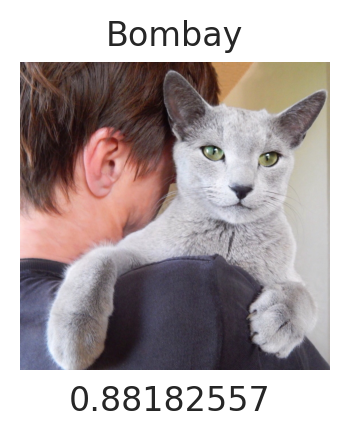

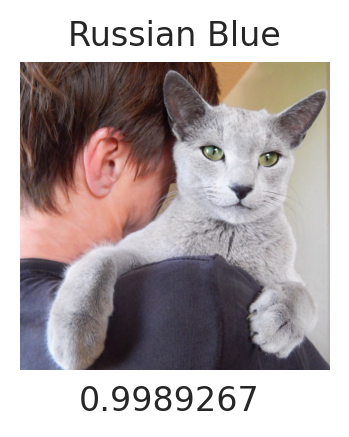

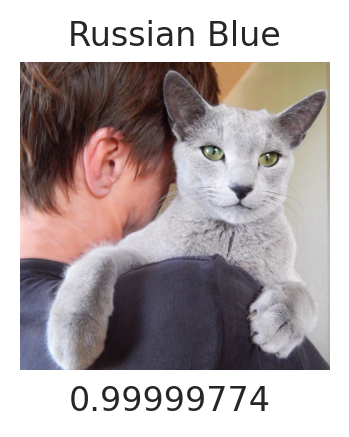

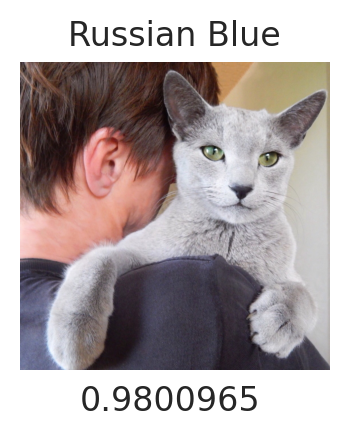

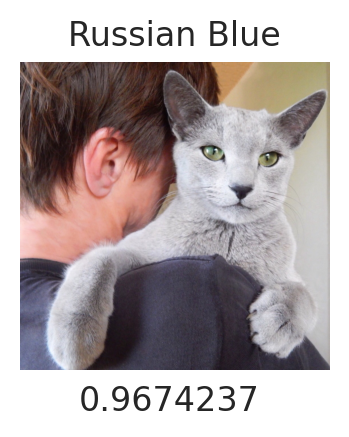

In [ ]:
image_url="https://myrussianblue.com/wp-content/uploads/2020/11/our-favourite-reymond-breed-russian-blue_t20_Aem8kP.jpg"

image = keras.utils.get_file(origin=image_url)
print("Model Basic")
predict_cat_breed(image, model_basic)

print("Model Resnet101V2")
predict_cat_breed(image, model_ResNet)

print("Model Resnet101V2 + Data Augmentation")
predict_cat_breed(image, model_ResNetV2)

print("Model DenseNet169")
predict_cat_breed(image, model_DenseNet)

print("Model gabungan")
predict_cat_breed(image, model_mixed)

18298/18298 [==============================] - 0s 0us/step
Model Basic
1/1 [==============================] - 0s 20ms/step
Model Resnet101V2
1/1 [==============================] - 0s 28ms/step
Model Resnet101V2 + Data Augmentation
1/1 [==============================] - 0s 27ms/step
Model DenseNet169
1/1 [==============================] - 0s 32ms/step
Model gabungan
1/1 [==============================] - 0s 44ms/step


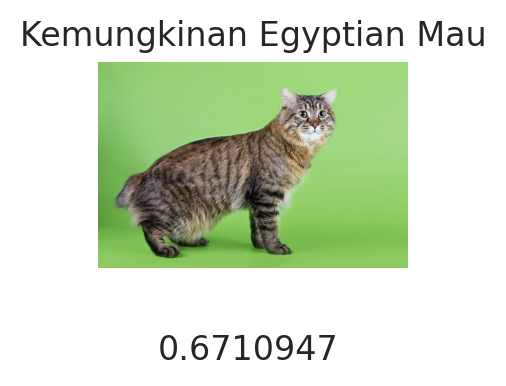

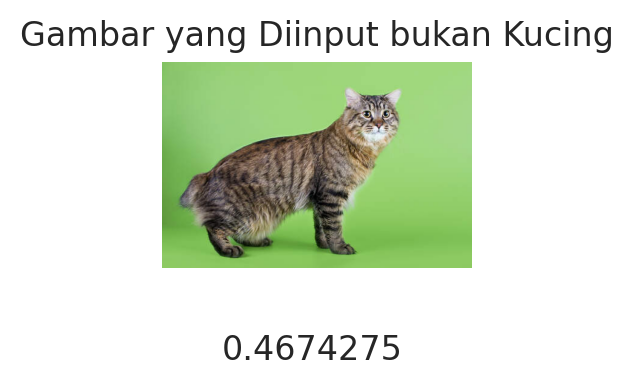

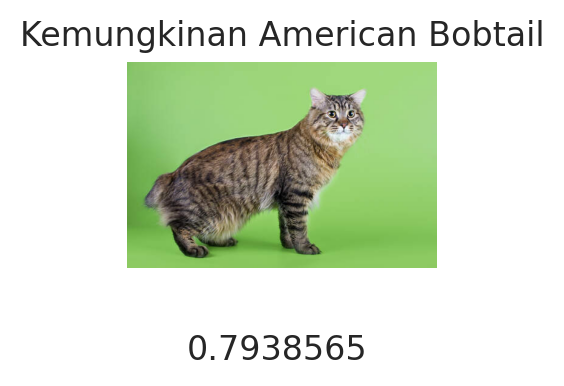

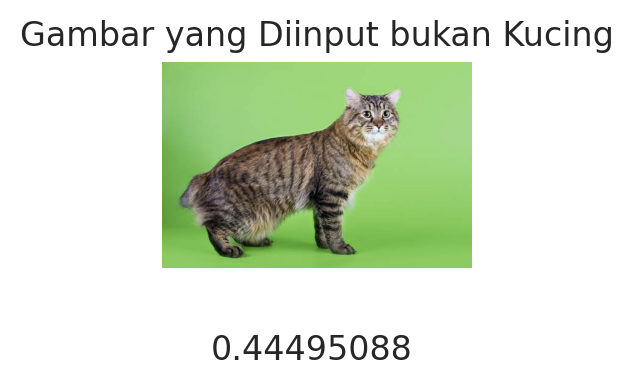

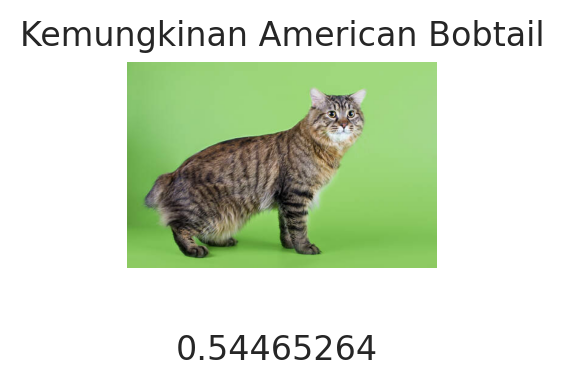

In [ ]:
image_url="https://www.omlet.co.uk/images/cache/512/341/Cat-Kurillian_Bobtail-A_brown_tabby_kurillian_bobtail_with_a_wild_look.jpg"

image = keras.utils.get_file(origin=image_url)
print("Model Basic")
predict_cat_breed(image, model_basic)

print("Model Resnet101V2")
predict_cat_breed(image, model_ResNet)

print("Model Resnet101V2 + Data Augmentation")
predict_cat_breed(image, model_ResNetV2)

print("Model DenseNet169")
predict_cat_breed(image, model_DenseNet)

print("Model gabungan")
predict_cat_breed(image, model_mixed)

50662/50662 [==============================] - 0s 0us/step
Model Basic
1/1 [==============================] - 0s 22ms/step
Model Resnet101V2
1/1 [==============================] - 0s 28ms/step
Model Resnet101V2 + Data Augmentation
1/1 [==============================] - 0s 28ms/step
Model DenseNet169
1/1 [==============================] - 0s 38ms/step
Model gabungan
1/1 [==============================] - 0s 51ms/step


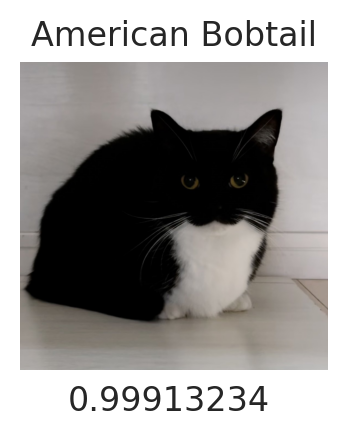

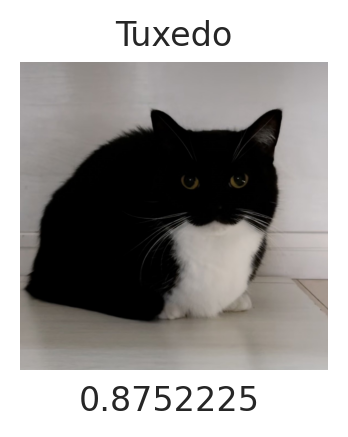

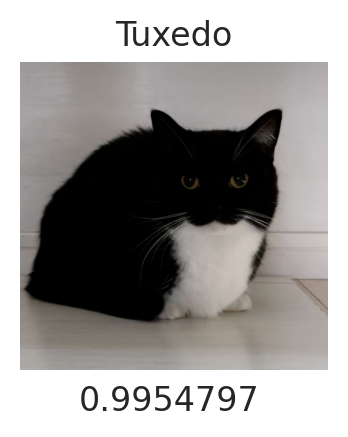

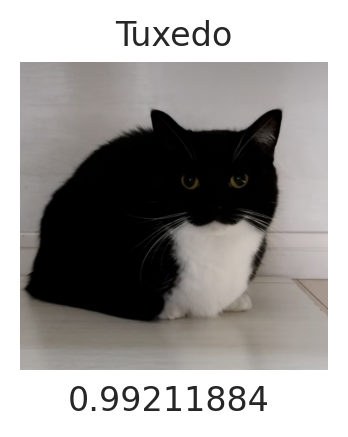

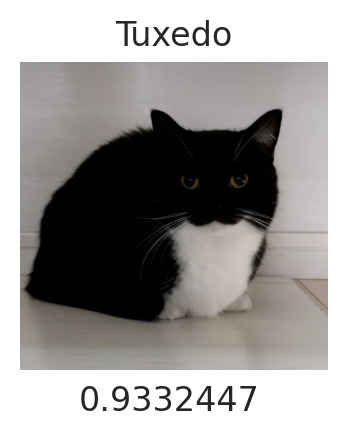

In [ ]:
image_url="https://pbs.twimg.com/media/FpuxcfiX0AAuUA4.jpg"

image = keras.utils.get_file(origin=image_url)
print("Model Basic")
predict_cat_breed(image, model_basic)

print("Model Resnet101V2")
predict_cat_breed(image, model_ResNet)

print("Model Resnet101V2 + Data Augmentation")
predict_cat_breed(image, model_ResNetV2)

print("Model DenseNet169")
predict_cat_breed(image, model_DenseNet)

print("Model gabungan")
predict_cat_breed(image, model_mixed)

63492/63492 [==============================] - 0s 1us/step
Model Basic
1/1 [==============================] - 0s 20ms/step
Model Resnet101V2
1/1 [==============================] - 0s 29ms/step
Model Resnet101V2 + Data Augmentation
1/1 [==============================] - 0s 34ms/step
Model DenseNet169
1/1 [==============================] - 0s 32ms/step
Model gabungan
1/1 [==============================] - 0s 43ms/step


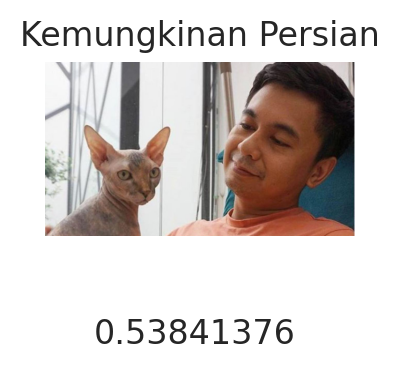

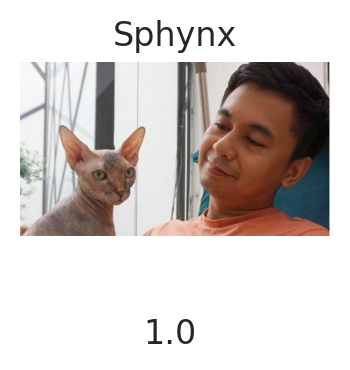

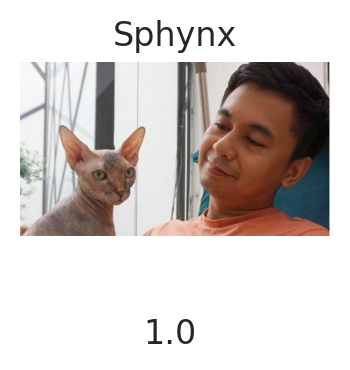

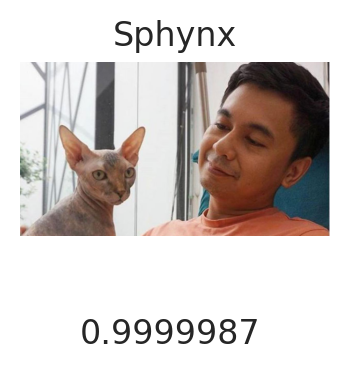

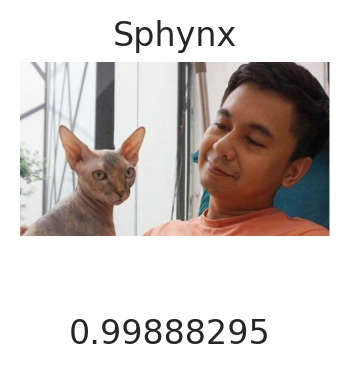

In [ ]:
image_url="https://cdn0-production-images-kly.akamaized.net/_F3MCOGuIedwKgiQVT4EP2jdcrE=/1200x675/smart/filters:quality(75):strip_icc():format(jpeg)/kly-media-production/medias/2782480/original/006247300_1555577809-Kucing_Dika.JPG"

image = keras.utils.get_file(origin=image_url)
print("Model Basic")
predict_cat_breed(image, model_basic)

print("Model Resnet101V2")
predict_cat_breed(image, model_ResNet)

print("Model Resnet101V2 + Data Augmentation")
predict_cat_breed(image, model_ResNetV2)

print("Model DenseNet169")
predict_cat_breed(image, model_DenseNet)

print("Model gabungan")
predict_cat_breed(image, model_mixed)

In [ ]:
model_basic.save("/content/gdrive/MyDrive/SEMESTER 4/UAS/Model_basic")
model_ResNet.save("/content/gdrive/MyDrive/SEMESTER 4/UAS/Model_Resnet")
model_ResNetV2.save("/content/gdrive/MyDrive/SEMESTER 4/UAS/Model_Resnet_Aug")
model_DenseNet.save("/content/gdrive/MyDrive/SEMESTER 4/UAS/Model_Densenet")
model_mixed.save("/content/gdrive/MyDrive/SEMESTER 4/UAS/Model_Mixed")